In [16]:
import os.path as path
import os
up = path.abspath(path.join('FastRCNNPredictor.ipynb' ,"../../../.."))

In [17]:
up

'c:\\Users\\shaur\\OneDrive\\Documents'

In [18]:
working_dir = up + '/GitHub/detect-waste/FastRCNN/'
data_file = up + '/GitHub/detect-waste/annotations/annotat.csv'
data_folder = up + '/GitHub/detect-waste/TACO/data/'
model_path = up + '/GitHub/detect-waste/models/model.pth'
num_classes = 28

In [19]:
os.chdir(working_dir)

In [20]:
import numpy as np
import os
import torch
import pycocotools
import torch.utils.data
from PIL import Image
import pandas as pd
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from engine import train_one_epoch, evaluate
import utils
import transforms as T
from  PIL import ImageDraw
import os.path as path
import re

In [21]:
def parse_one_annot(path_to_data_file, filename):
    data = pd.read_csv(path_to_data_file)
    print(filename)
    boxes_array = data[data["filename"] == filename][["xmin", "ymin",        
    "xmax", "ymax"]].values
    print(boxes_array)
    return boxes_array

In [22]:
def getListOfFiles(dirName):
    listOfFile = os.listdir(dirName)
    allFiles = list()
    for entry in listOfFile:
        fullPath = os.path.join(dirName, entry)
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
                fullPath = fullPath.replace(data_folder, '')
                allFiles.append(fullPath)  
    return allFiles    

In [23]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self, root, data_file, transforms=None):
        self.root = root
        self.transforms = transforms
        files = getListOfFiles(os.path.join(root))
        p = re.compile('batch')
        l2 = [ s for s in files if p.match(s) ]
        self.imgs = sorted(l2)
        self.path_to_data_file = data_file
    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.imgs[idx])
        self.imgs[idx] = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        box_list = parse_one_annot(self.path_to_data_file, self.imgs[idx])
        boxes = torch.as_tensor(box_list, dtype=torch.float32)
        num_objs = len(box_list)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:,0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        if self.transforms is not None:
                 img, target = self.transforms(img, target)
        return img, target
    
    def __len__(self):
        return len(self.imgs)

In [24]:
dataset = Dataset(root= data_folder, data_file= data_file)

In [25]:
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features,num_classes)
    return model

In [26]:
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [27]:
dataset = Dataset(root= data_folder, data_file= data_file , transforms = get_transform(train=True))
dataset_test = Dataset(root= data_folder, data_file= data_file , transforms = get_transform(train=False))

torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
testing_num = int(len(dataset)*0.2)
dataset = torch.utils.data.Subset(dataset, indices[:-testing_num])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-testing_num:])
data_loader = torch.utils.data.DataLoader(
              dataset, batch_size=2, shuffle=True, num_workers=0,
              collate_fn=utils.collate_fn)
data_loader_test = torch.utils.data.DataLoader(
         dataset_test, batch_size=1, shuffle=False, num_workers=0,
         collate_fn=utils.collate_fn)
print("We have: {} examples, {} are training and {} testing".format(len(indices), len(dataset), len(dataset_test)))

We have: 1500 examples, 1200 are training and 300 testing


In [28]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model(num_classes)
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

In [29]:
num_epochs = 10
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    print(epoch)
    lr_scheduler.step()
    evaluate(model, data_loader_test, device=device)
    

batch_1\000047.jpg
[]
batch_10\000072.jpg
[]
Epoch: [0]  [  0/600]  eta: 3:52:57  lr: 0.000013  loss: 3.2315 (3.2315)  loss_classifier: 3.2156 (3.2156)  loss_box_reg: 0.0000 (0.0000)  loss_objectness: 0.0160 (0.0160)  loss_rpn_box_reg: 0.0000 (0.0000)  time: 23.2961  data: 0.6141  max mem: 0
batch_6\000032.JPG
[]
batch_8\000061.jpg
[]
batch_2\000026.JPG
[]
batch_14\000075.jpg
[]
batch_1\000007.jpg
[]
batch_8\000034.jpg
[]
batch_1\000129.JPG
[]
batch_13\000025.jpg
[]
batch_13\000086.jpg
[]
batch_14\000003.jpg
[]
batch_3\IMG_5048.JPG
[]
batch_10\000073.jpg
[]
batch_7\000119.JPG
[]
batch_14\000042.jpg
[]
batch_8\000002.jpg
[]
batch_7\000022.JPG
[]
batch_13\000085.jpg
[]
batch_4\000070.JPG
[]
batch_15\000037.jpg
[]
batch_13\000068.jpg
[]
Epoch: [0]  [ 10/600]  eta: 3:15:19  lr: 0.000097  loss: 3.0485 (3.0143)  loss_classifier: 3.0451 (3.0085)  loss_box_reg: 0.0000 (0.0000)  loss_objectness: 0.0028 (0.0059)  loss_rpn_box_reg: 0.0000 (0.0000)  time: 19.8630  data: 0.4169  max mem: 0
batch_4\

KeyboardInterrupt: 

In [ ]:
torch.save(model.state_dict(), model_path)

In [ ]:
loaded_model = get_model(num_classes = num_classes)
loaded_model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

batch_5\000004.JPG
[]
batch_5\000004.JPG
[]
0.1221
0.1212
0.1056
0.1046
0.1032
0.1023
0.1022
0.099
0.0978
0.0975
0.0971
0.0947
0.0942
0.0911
0.0906
0.0898
0.0896
0.0876
0.0865
0.0863
0.0859
0.0858
0.0851
0.0849
0.0846
0.0843
0.0843
0.0824
0.0819
0.0808
0.0808
0.0807
0.0805
0.0804
0.0801
0.0801
0.0798
0.0792
0.0792
0.0789
0.0789
0.0788
0.0786
0.0784
0.0781
0.0779
0.0771
0.0767
0.0767
0.0764
0.0763
0.0759
0.0758
0.0758
0.0758
0.0755
0.0753
0.0751
0.075
0.0749
0.0749
0.0747
0.0745
0.0743
0.0741
0.0739
0.0739
0.0738
0.0737
0.0736
0.0733
0.0733
0.0733
0.0733
0.0732
0.073
0.073
0.0729
0.0728
0.0728
0.0726
0.0726
0.0724
0.0723
0.0721
0.0717
0.0715
0.0715
0.0715
0.0713
0.0713
0.0709
0.0709
0.0708
0.0708
0.0707
0.0707
0.0706
0.0706
0.0705


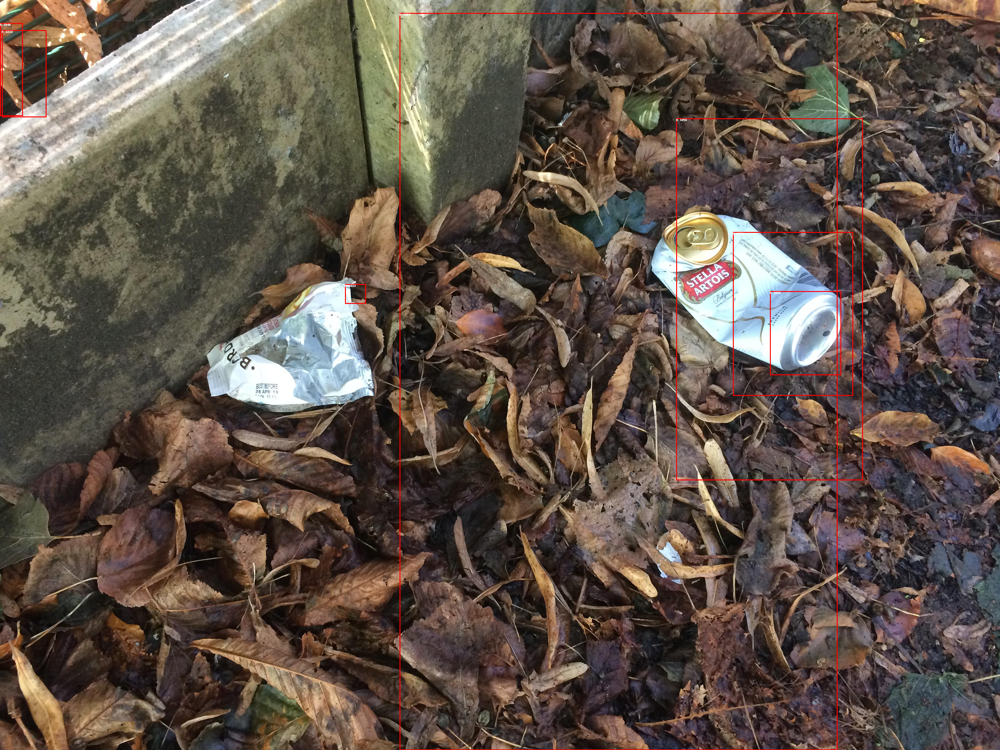

In [ ]:
idx = 154
img, _ = dataset_test[idx]
label_boxes = np.array(dataset_test[idx][1]["boxes"])
loaded_model.eval()
with torch.no_grad():
    prediction = loaded_model([img])
image = Image.fromarray(img.mul(255).permute(1, 2,0).byte().numpy())
draw = ImageDraw.Draw(image)
for elem in range(len(label_boxes)):
    draw.rectangle([(label_boxes[elem][0], label_boxes[elem][1]),
    (label_boxes[elem][2], label_boxes[elem][3])], 
    outline ="green", width =3)
for element in range(len(prediction[0]["boxes"])):
    boxes = prediction[0]["boxes"][element].cpu().numpy()
    score = np.round(prediction[0]["scores"][element].cpu().numpy(),
                    decimals= 4)
    print(score)
    if score > 0.8:
        draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])], 
        outline ="red", width =3)
        draw.text((boxes[0], boxes[1]), text = str(score))
image
